# Social Media Perspective on Community Vitality in the Quad Cities

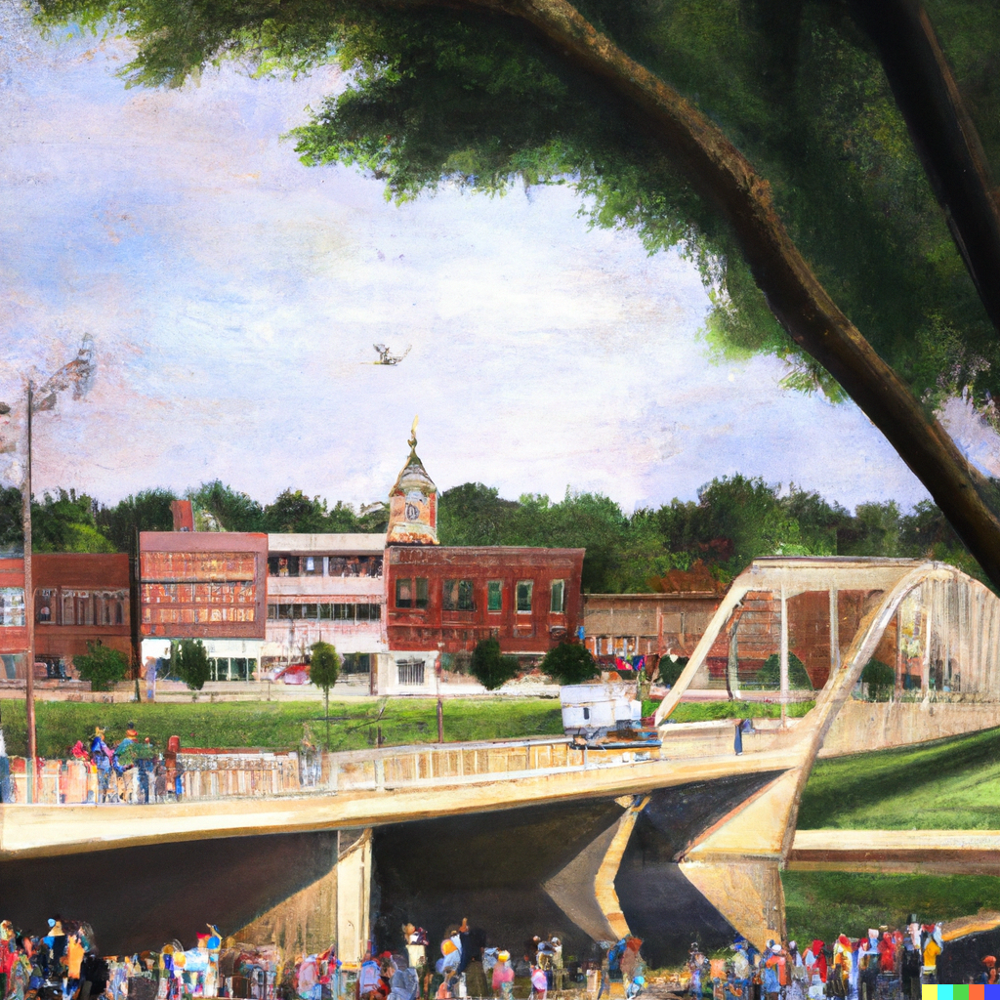

In [1]:
from IPython.display import Image
Image(filename='/Users/winiboya/Downloads/quadcities.png') 

*This is an AI generated painting of my community.*

## ABSTRACT
This project is meant to analyze the community vitality of the Quad Cities--a community in Iowa and Illinois--using local perspectives. To do this, I conducted Twitter sentiment analysis on local tweets using a natural languagae processing library. By analyzing the sentiment and polarity of these tweets and visualizing the results with word clouds, I was able to get a sense of the local perception of community vitality and areas for improvement.

## METHODS 

### Data Source
I selected local tweets that included the name of one of the Quad Cities and a word related to one of my five chosen categoris: crime, education, arts, and infrastructure. The Twitter API made this queries quite simple to pass through. I was able to write specific queries for each of the five categories to return tweets for analysis. For example, the crime tweets query would have selected tweets that included "Davenport" and "shooting" or "Moline" and "theft." These tweets are selected from the last week.

### Data Cleaning
The data cleaning step is mostly handled by the Twitter API. However, I did remove retweets, tweets not in English, and usernames (for the world cloud).

### Sentiment Analysis Tools
I mainly used the Python TextBlob library to perform the natural language processing (NLP). Per the TextBlob documentation, "TextBlob aims to provide access to common text-processing operations through a familiar interface. You can treat TextBlob objects as if they were Python strings that learned how to do Natural Language Processing." The most useful part of this library was the ability to categorize tweets by polarity (a negative number, positive number, or zero) and subsequently the sentiment (negative, positive, neutral). 

### Creating Word Clouds
To visualize the results, I used the Word Cloud library in Python, which allowed me to generate word clouds from the tweets based on their frequency. The most common words appear largest, which adds to the visual representiation of local perceptions on my community.

### Reliability and Validity
Based on manual analysis of the tweets (i.e., looking at the tweets myself to see if they fit the category and the assigned sentiment), these methods seem to work well. However, this is not to say that it is perfect. For example, sentiment analysis is not as helpful for the crime category where most tweets are negative (but many have been assigned positive). 

### Writing Functions
Below are several functions I wrote to extract, clean, and analyze data and create the world clouds. The comments above each function should give an adequate description of what it does.


## SETTING UP


In [2]:
# import libraries
import tweepy
from textblob import TextBlob
import re
import nltk
import pandas as pd
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

In [3]:
# pandas df views
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)

In [4]:
# get Twitter client
client = tweepy.Client(bearer_token='AAAAAAAAAAAAAAAAAAAAAPmSkAEAAAAAeDvwJAS%2FG0Wt%2Feo32aCgAGG6XVY%3DlzwPoCY8OC76SrOVeaDU67DRuwI4KbyII067QewtfQOXfEcmIN')

In [5]:
# function to remove unnecessary content from tweets
def clean_tweet(tweet): 
    return ' '.join(word for word in tweet.split(' ') if not "@" in word and not word.startswith('#') and not "https" in word)
    
# function to determine the polarity and sentiment of a tweet
def get_sentiment(tweet):
    analysis = TextBlob(tweet)
    polarity = analysis.sentiment.polarity
    if polarity == 0:
        return polarity, 'neutral'
    elif polarity > 0:
        return polarity, 'positive'
    else:
        return polarity, 'negative'
    
# function to retreive tweets using Twitter API; then asigns polarity and sentiment
def get_tweets(query, count):
    tweets = []
    fetched_tweets = tweepy.Paginator(client.search_recent_tweets, query=query, tweet_fields=['context_annotations', 'created_at'], max_results=100).flatten(limit=count)
    for tweet in fetched_tweets:
        parsed_tweet = {}
        parsed_tweet['text'] = clean_tweet(tweet.text)
        parsed_tweet['polarity'], parsed_tweet['sentiment'] = get_sentiment(tweet.text)
        if parsed_tweet not in tweets:
            tweets.append(parsed_tweet)
    return tweets

# function to get just positive or negative tweets for a category
def get_pos_neg(tweets, sentiment):
    if sentiment == 1:
        return [tweet for tweet in tweets if tweet['sentiment'] == 'positive']
    else:
        return [tweet for tweet in tweets if tweet['sentiment'] == 'negative']
    
# function to create world cloud of most frequent words
def word_cloud(tweets):
    text_tweets = [tweet['text'] for tweet in tweets]
    string = pd.Series(text_tweets).str.cat(sep=' ')
    stopwords = set(STOPWORDS)
    stopwords.update(["Davenport","MOLINE", "Moline", "Bettendorf","s", "quadcities511", "U", "Cities", "Quad","Rock Island", "IA", "Iowa", "Sioux", "Illinois", "IL" "Moline", "County", "Lucas", "Bearcats", "co", "Bryant", "t", "sentence", "even", "Y40", "B4pC4iPy0E",  "Cleveland", "Seul Choix", "EST", "MQT"]) 
    wordcloud = WordCloud(width=1600, colormap='tab20', stopwords=stopwords, height=800, max_font_size=200, max_words=50, collocations=False, background_color='white').generate(string)
    plt.figure(figsize=(40,30))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()


In [6]:
# queries for different categories
crime_query = '((quad cities OR davenport OR moline OR bettendorf) (crime OR theft OR gun OR killing OR murder OR assault OR police OR arrest OR authorities) lang:en -is:retweet)'
education_query = '((quad cities OR davenport OR moline OR bettendorf) (education OR schools OR elementary OR learning) lang:en -is:retweet)'
arts_query = '((quad cities OR davenport OR moline OR bettendorf) (art OR  music OR performance) lang:en -is:retweet)'
infrastructure_query = '((quad cities OR davenport OR moline OR bettendorf) (road OR  bridge OR expansion OR construction OR highway OR park) lang:en -is:retweet)'
environment_query = '((quad cities OR davenport OR moline OR bettendorf) (environment OR river OR pollution OR mississipi OR sustainability OR habitat OR recycling OR climate OR wildlife OR nautre OR ecosystem OR carbon) lang:en -is:retweet)'
main_query = '((quad cities OR davenport OR moline OR bettendorf) lang:en -is:retweet)'

In [7]:
# get tweets based on queries
main_tweets = get_tweets(main_query, 1000)
crime_tweets = get_tweets(crime_query, 1000)
education_tweets = get_tweets(education_query, 1000)
arts_tweets = get_tweets(arts_query, 1000)
infrastructure_tweets = get_tweets(infrastructure_query, 1000)
environment_tweets = get_tweets(environment_query, 1000)

## CRIME

In [8]:
# crime tweet analysis
pos_crime_tweets = get_pos_neg(crime_tweets, 1)
neg_crime_tweets = get_pos_neg(crime_tweets, -1)
df_crime = pd.DataFrame.from_dict(crime_tweets)
df_crime_pos = pd.DataFrame.from_dict(pos_crime_tweets)
df_crime_neg = pd.DataFrame.from_dict(neg_crime_tweets)

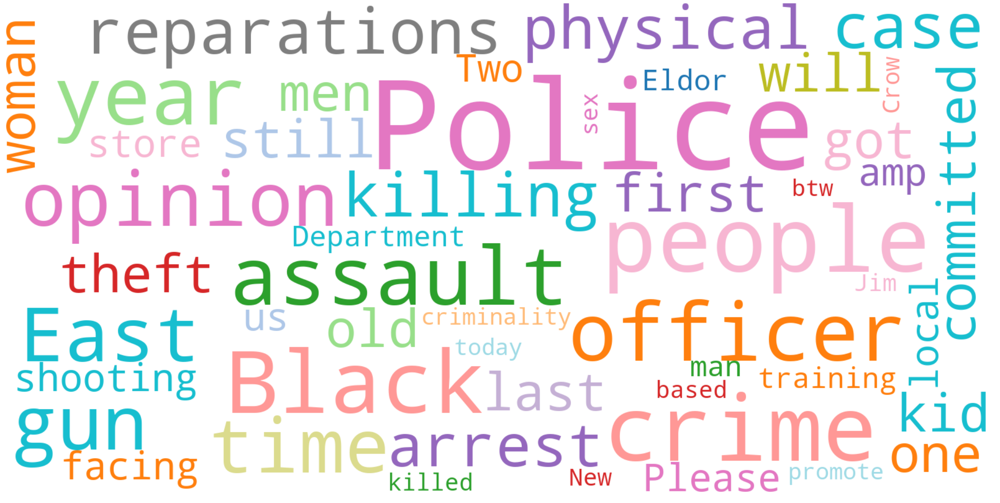

In [9]:
word_cloud(crime_tweets)

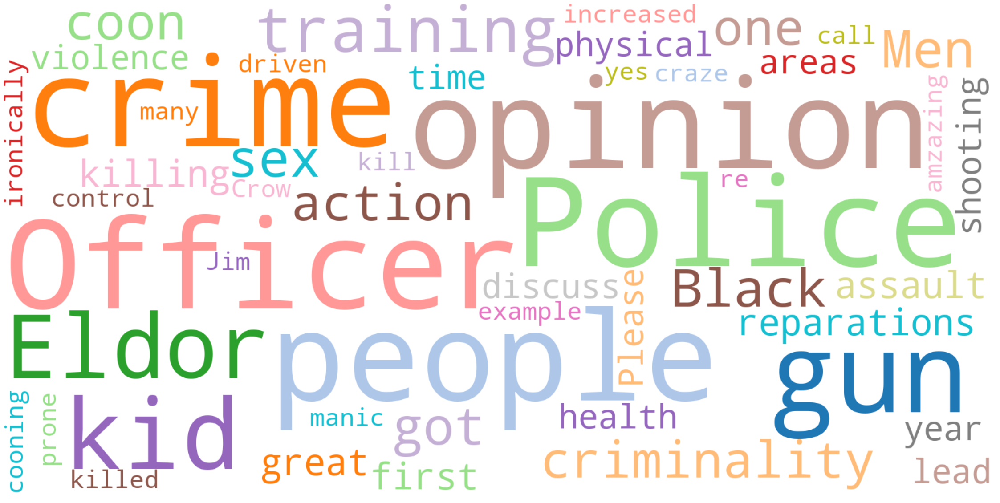

In [10]:
word_cloud(pos_crime_tweets)

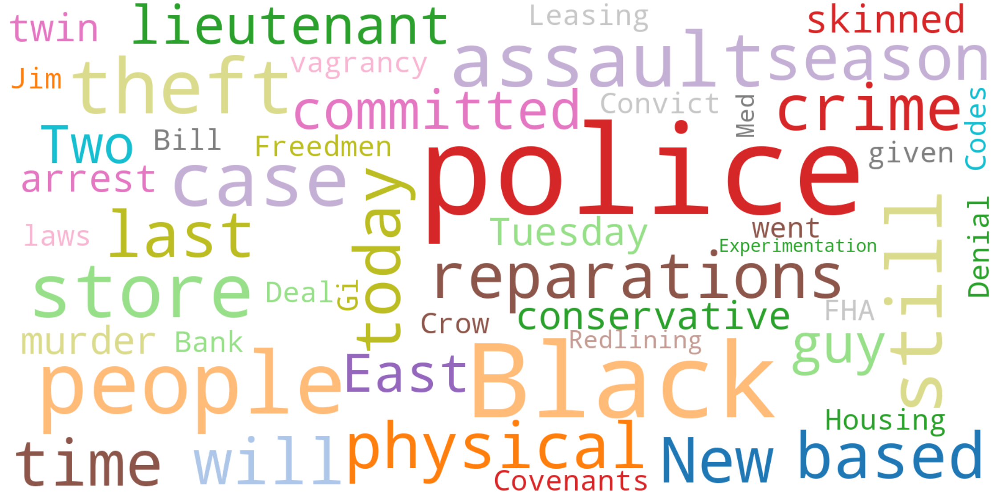

In [11]:
word_cloud(neg_crime_tweets)

**Obersvations on crime word clouds:**
- *Police* is the largest word in the clouds for obvious reasons
- (+) *Eldor* is a recent graduate for the Moline Police Department (he is black and highly featured on their social media)
- (+) *Justified* refers to police who were acquitted on a fatal shooting
- (-) *Black* is one of the largrest words
- (-) *West* is the name of a local high school where a teacher was arrested
- (-) *Township* refers to United Township High School

## EDUCATION 

In [12]:
# education tweet analysis
pos_education_tweets = get_pos_neg(education_tweets, 1)
neg_education_tweets = get_pos_neg(education_tweets, -1)
df_education = pd.DataFrame.from_dict(education_tweets)
df_education_pos = pd.DataFrame.from_dict(pos_education_tweets)
df_education_neg = pd.DataFrame.from_dict(neg_education_tweets)

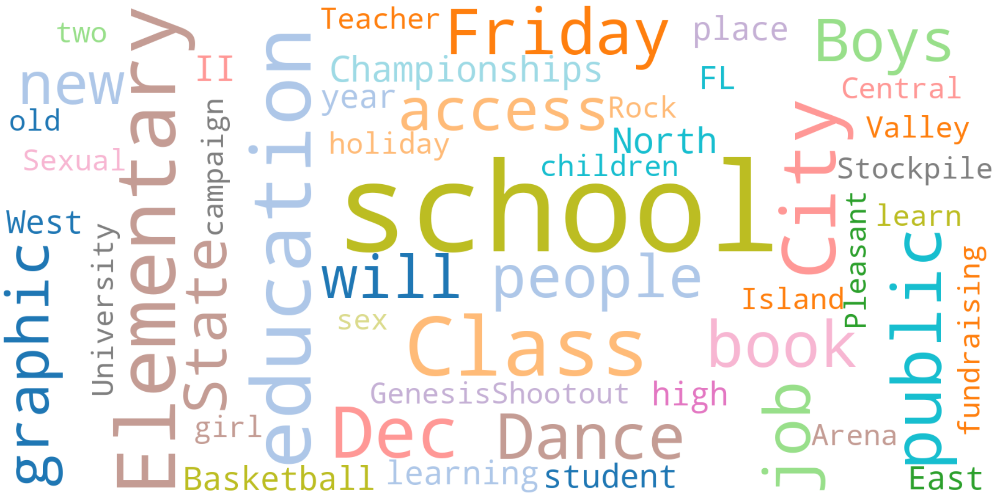

In [13]:
word_cloud(education_tweets)

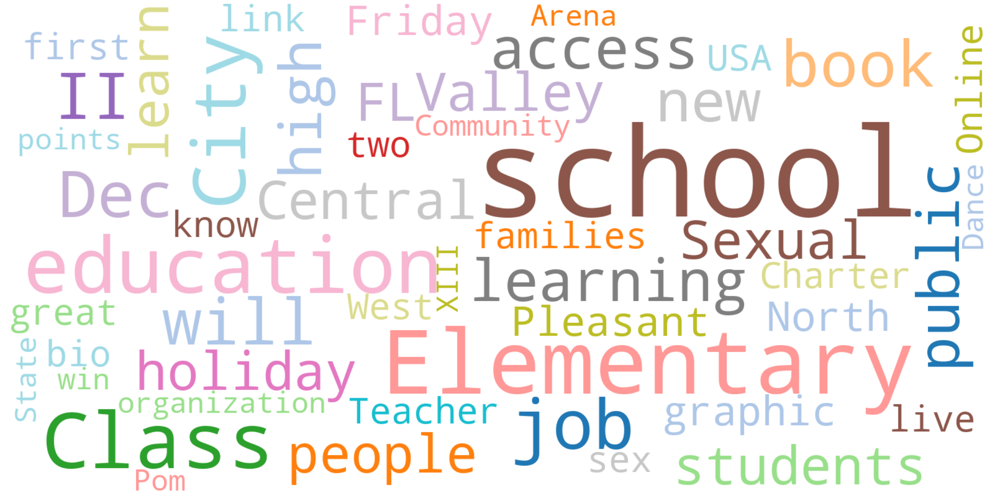

In [14]:
word_cloud(pos_education_tweets)

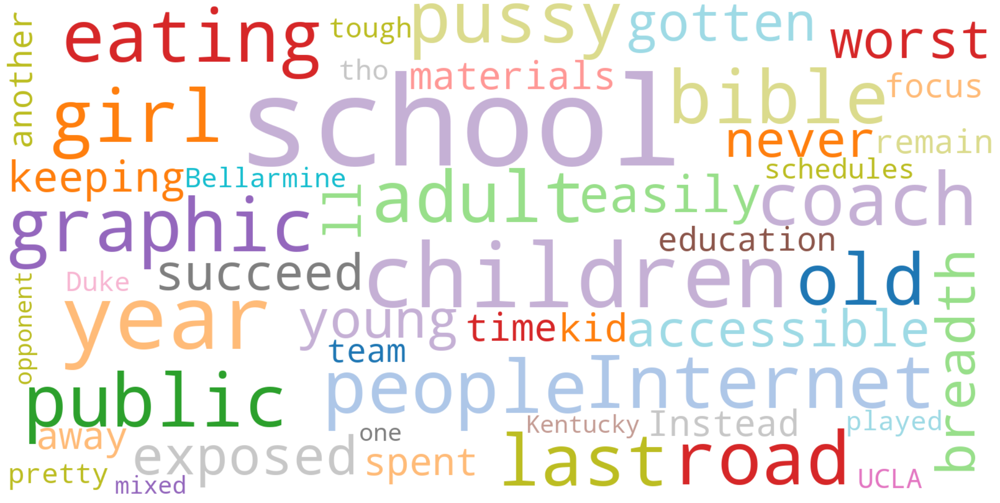

In [15]:
word_cloud(neg_education_tweets)

**Obersvations on education word clouds:**
- Many of the words involve athletics: *Basketball, Stockpie (the name of a recurring score tweet), Basketball"
- (+) *Elementary* schools seem to get the most positive tweets (although school closings were assigned positive sentiment)
- (+) *Pleasant* refers to the Pleasant Valley School District which is one of the top in the state, certainly in the Quad Cities
- (+) *Sexual* refers not to sexual assault but to sex ed and fighting against grooming
- (-) *Internet and accesible* comes from discussions on the accessibility of porn online
- (-) *Bible and church* refer to arguments about banned books

*Note: there were not very many negative tweets so the negative sentiment cloud is not as accurate.

## ARTS
*Note: there were not enough negative tweets for positive vs negative analysis to be beneficial.*

In [16]:
# arts tweet analysis
df_arts = pd.DataFrame.from_dict(arts_tweets)

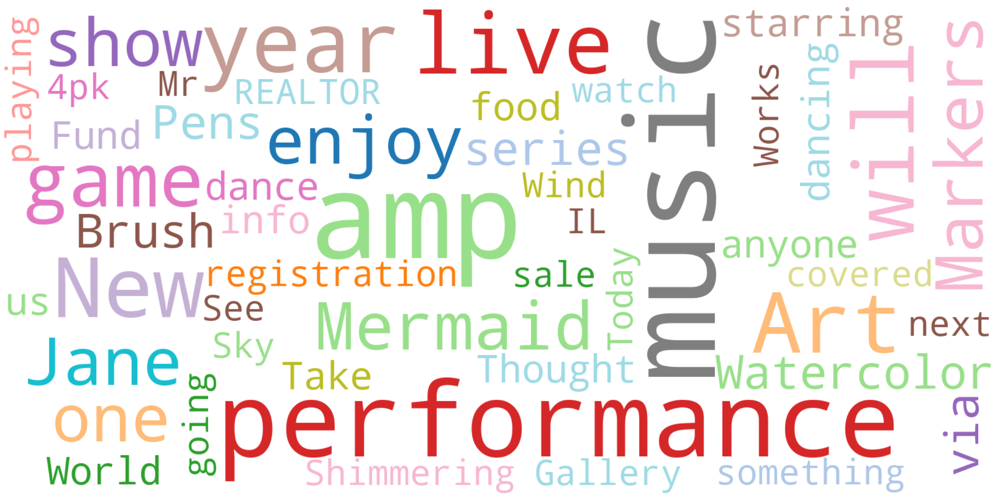

In [17]:
word_cloud(arts_tweets)

**Obersvations on arts word clouds:**
- *Performance* refers to school performances, art, and live music

## INFRASTRUCTURE

In [18]:
# infrastructure tweet analysis
pos_infrastructure_tweets = get_pos_neg(infrastructure_tweets, 1)
neg_infrastructure_tweets = get_pos_neg(infrastructure_tweets, -1)
df_infrastructure = pd.DataFrame.from_dict(infrastructure_tweets)
df_infrastructure_pos = pd.DataFrame.from_dict(pos_infrastructure_tweets)
df_infrastructure_neg = pd.DataFrame.from_dict(neg_infrastructure_tweets)

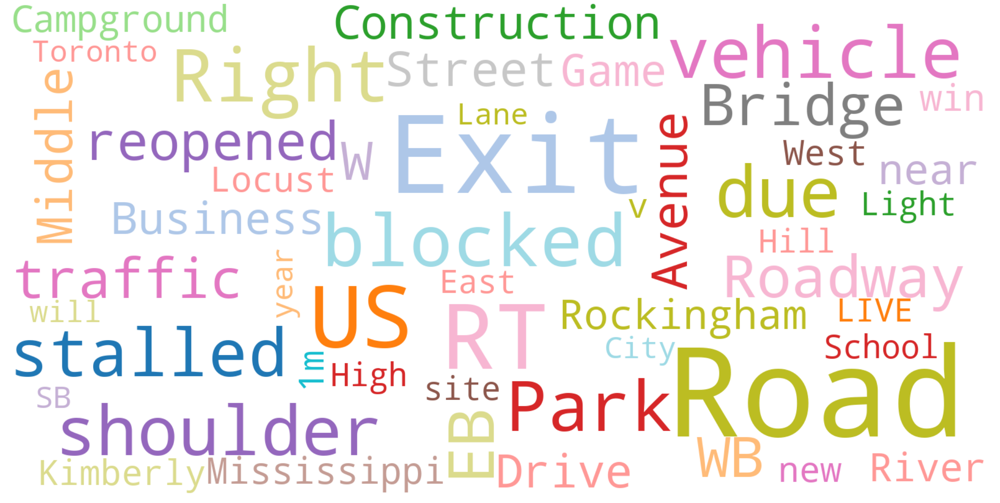

In [19]:
word_cloud(infrastructure_tweets)

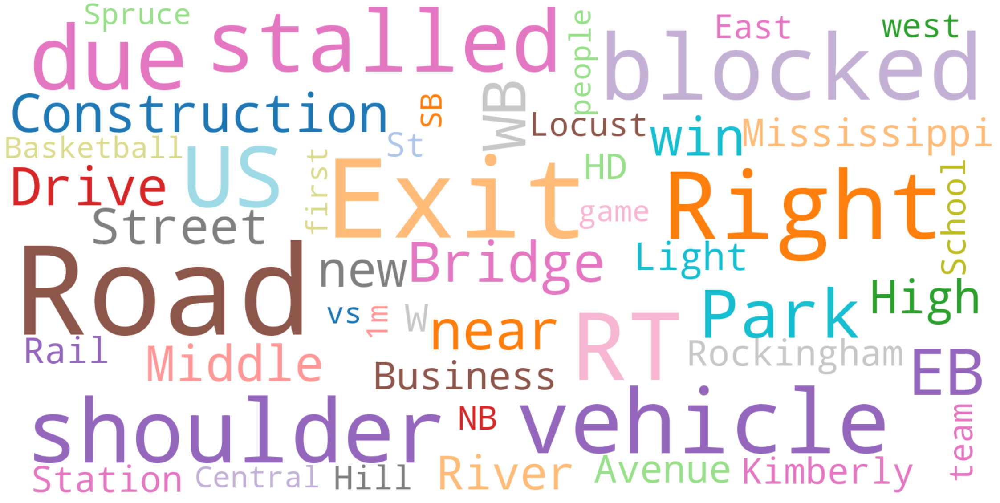

In [20]:
word_cloud(pos_infrastructure_tweets)

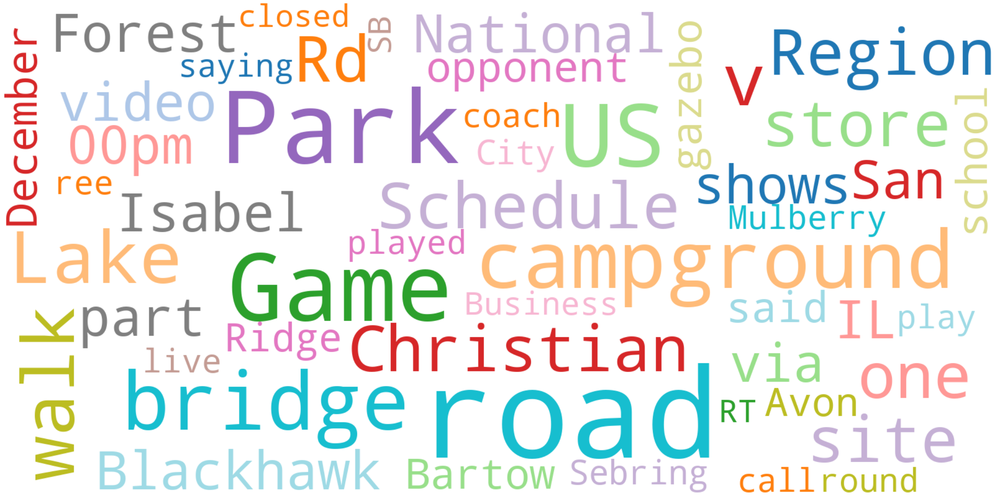

In [21]:
word_cloud(neg_infrastructure_tweets)

**Obersvations on infrastructure word clouds:**
- *Exit* most often appears in announcements of closures or construction
- *Bridge* could refer to any number of bridges that connect IA and IL
- The *Mississippi River* is the divider between the IA and IL parts of the Quad Cities
- *Middle* and *Locust* are the names of the same busy street in Davenport and Bettendorf
- *EB, SB, and WB* mean eastbound, southbound, and westbound

## ENVIRONMENT

In [22]:
# education tweet analysis
pos_environment_tweets = get_pos_neg(environment_tweets, 1)
neg_environment_tweets = get_pos_neg(environment_tweets, -1)
df_environment = pd.DataFrame.from_dict(environment_tweets)
df_environment_pos = pd.DataFrame.from_dict(pos_environment_tweets)
df_environment_neg = pd.DataFrame.from_dict(neg_environment_tweets)

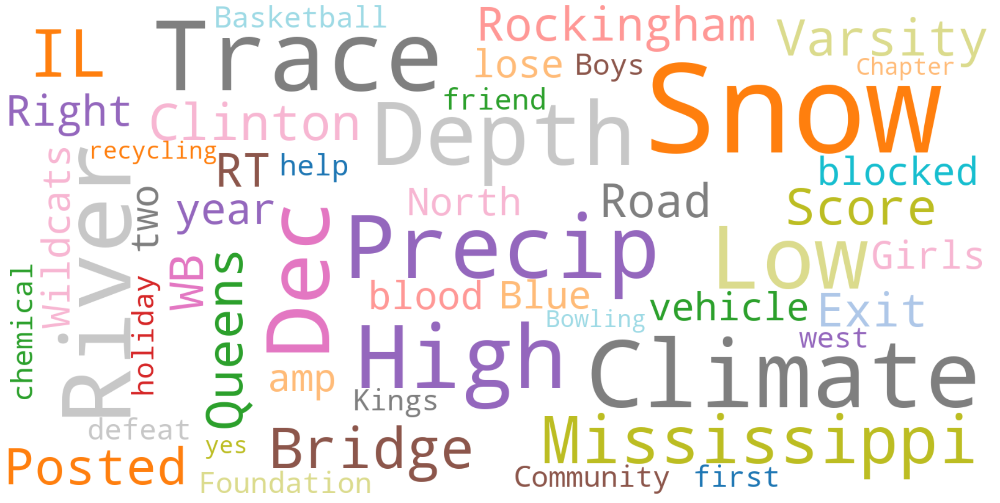

In [23]:
word_cloud(environment_tweets)

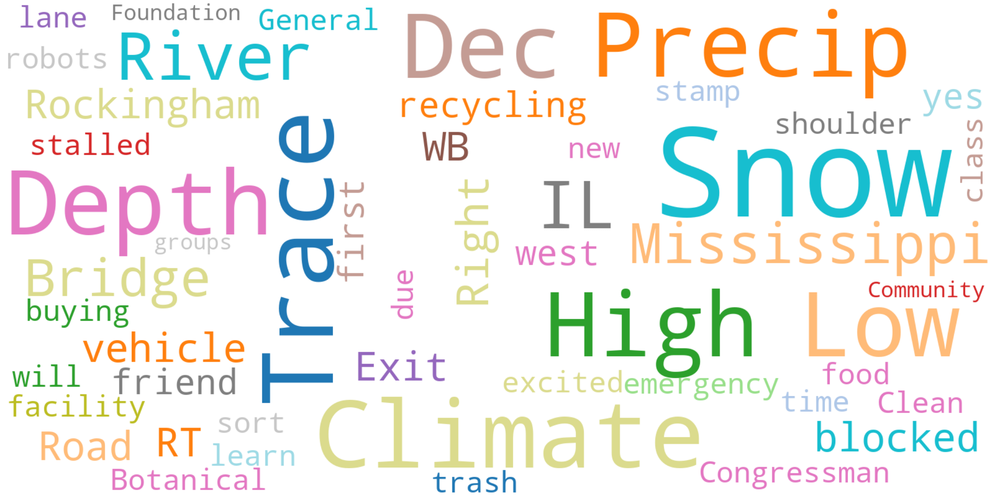

In [24]:
word_cloud(pos_environment_tweets)

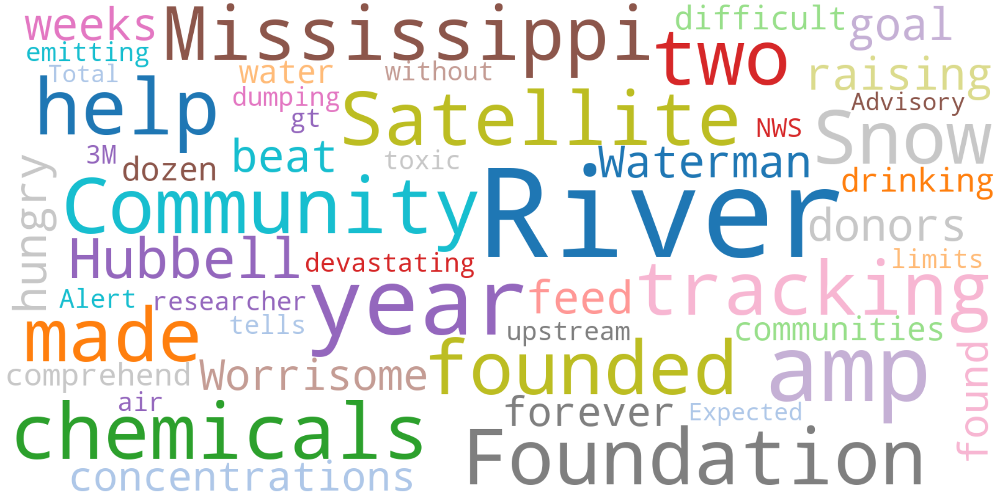

In [25]:
word_cloud(neg_environment_tweets)

**Obersvations on infrastructure word clouds:**
- *River* refers to the Mississippi River
- *Climate and snow* refer to local weather forecasts
- (+) Positive sentiment words are similar to overall as most positive tweets are forecasts
- (-) *Worrisome and chemicals* refer to recently discovered pollutants
- (-) *Emitting* refers to toxic chemcials


## Takeaways

**Crime:** Public perception of crime centers on the police, whether positive or negative. Further, in just a week's worth of tweets the involvement of race in these discussions is clear. One Moline Police Department officer is frequently mentioned on their social media despite his lack of experience but likely because he is black. "Black" is also one of the most common words in the negative word cloud. In my own experience, black people in our community are arrested at much higher rates and community awareness of this is not very high--leading to further anti-black rhetoric.

**Education:** Education seems to center around sports, with "basketball" (the sport in season) and "championship" being relatively large. Currently contentious issues seem to be sex ed and the accessibility of porn online, leading to words like "sexual," "internet," "accessible." Religious terms also appear because of attempts to use immorality to justify exclusion of certain topics (of a sexual nature or in relation to banned books).

**Arts:** The arts category seems to have the most variety in general topic areas, which is what I would have expected. The Quad Cities have vibrant live music scenes as well as successful school music programs (there were several tweets about my high school's band going to London to perform at a New Year's parade).

**Infrastructure:** Infrastructure discussions, as expected, are mostly complaints or updates about roads, highways, and bridges. Specifically, a new bridge was just built and another is being planned (over the "Mississippi," another frequent term).

**Environment:**  The largest word: snow. This is likely because a very large snow storm coming this week that will shut down much of the Quad Cities (in addition to -38 degree weather). Much of the other positive environmental discussions deal with forecasts, while negative sentiment applies to pollution in the Mississippi River (which is source of water).


Overall, my community seems to be focused on short-term. Even with tweets over the last week, very few reference anything outside of that. For example, the environment discussions center on current weather, infrastructure tweets deal with closures and updates on construction, etc. This focus on only the current week may be due to a variety of factors, but I attribute it mostly to financial constraints (and the lack of considering long term benefits that comes with financial instability). In my most immediate community, many families around me do not have the overall vitality necessary to consider their future happiness, instead they are just trying to survive. This mindset is seen clearly in the analysis of these tweets. My hope for the future of my community is that people of color will have more access to opportunity, allowing them to think outside of the present. This opportunity would help to create a more sustainable and thriving environment for all members of our community.